## data preprocessing/cleaning pipeline
All 14 scenes 

### From xlsx to tsv

In [3]:
import pandas as pd
import os

output_dir = r"C:\Users\isaia\OneDrive\Desktop\Academic work\Scholarly activities\Research voluntering\Research voluntering 2024 Dr. Sanocki\Scene gist coding\data\tsv"
os.makedirs(output_dir, exist_ok = True)

# function to convert xlsx to tsv.
def xlsx_to_tsv(xlsx_path, tsv_path, sheet_name = 0):
    df = pd.read_excel(xlsx_path, sheet_name = sheet_name)
    df.to_csv(tsv_path, sep = "\t", index = False)
    print(f"Coverted {xlsx_path} to {tsv_path}")

In [4]:
# converting Xlsx to tsv.
xlsx_filepath = r"C:\Users\isaia\OneDrive\Desktop\Academic work\Scholarly activities\Research voluntering\Research voluntering 2024 Dr. Sanocki\Scene gist coding\data\xlsx\Ad_Final cleaned 14 scenes 9.12.24.xlsx"
tsv_savepath = os.path.join(output_dir, "Ad_Final_cleaned_14_scenes.tsv") 

xlsx_to_tsv(xlsx_filepath, tsv_savepath) 

Coverted C:\Users\isaia\OneDrive\Desktop\Academic work\Scholarly activities\Research voluntering\Research voluntering 2024 Dr. Sanocki\Scene gist coding\data\xlsx\Ad_Final cleaned 14 scenes 9.12.24.xlsx to C:\Users\isaia\OneDrive\Desktop\Academic work\Scholarly activities\Research voluntering\Research voluntering 2024 Dr. Sanocki\Scene gist coding\data\tsv\Ad_Final_cleaned_14_scenes.tsv


* Isaias Annotations.

By converting the xlsx file to a tsv, we can then use the Jsonify function developed by Dr. Kim to transform the tsv into a json file. (Describe the steps to the process).
A simple way to remove bad encoding is highlight the text "\\0u00", right click and select "change all occurrences" and hit delete. (This is a VScode feature).

You will need to use pip install when it comes to using the CLIP embedder. 
- pip install transformers 
- pip install torch tourchvision torchaudio

add_embedding & clip_embedder are especially importent for this. 
- Original clip_embedder was slightly changed. 
    - Key point, device was changed from "cuda" to "CPU".
- Original add_embeddingings was heavily altered. Key points.
    - INFILE, OUTFILE, AND BASENAME were changed to work on personal computer.
    - process_subject function was changed to remove llama2_embs and mistral_embs. Clip_embedder was retained.
    - changes were made for "id": subjdata["Int_id"] to accomadate changes made to labeling in json file.
    - added line to handle permission issues "output_file_path".
    


## visualization and analysis

In [5]:
import json
import numpy as np

jdat = json.load(open(r"C:\Users\isaia\OneDrive\Desktop\Academic work\Scholarly activities\Research voluntering\Research voluntering 2024 Dr. Sanocki\Scene gist coding\data\json_with_embeddings\Ad_final_cleaned_14_scenes_manual_encoding_cleanup_emb.json"))


In [6]:
jdat["file"][0]

{'id': '1',
 'response_texts': {'Scene_1_Campsite': 'the sun between the two pine trees, a tent in front of the two pines. a green flask at the bottom of the scene, flat dirt ground',
  'Scene_2_Woman_above_Canyon': 'a woman in a white dress taking a picture of a mountain scenery. lots of trees, clear skies, a gap between the mountain she is looking at and the one she is sitting on.',
  'Scene_3_Brick_Town_Wall': 'a river going through a town, a few people sitting on the benches on the riverside, a few houses behind the benches. a small road in between the houses and benches.',
  'Scene_4_Surfers': 'six surfers riding a wave, most of the surf boards are yellow and all surfers appeared to be male.',
  'Scene_5_Zero_Bench': 'three light bars on the ceiling, the number 0 painted in black on the wall and a black bench to the right of the 0. a gray room',
  'Scene_6_Old_White_Wall': 'broken walls, large doors with a piece of wood covering a hole, all white paint.',
  'Scene_7_Deck_Lights': 

In [7]:
# done to remove incomplete response profile for PID 31: scene 4 and 7 do not have responses.
for datadict in jdat["file"]:
    if datadict["id"] == "34":
        for datakey in ["clip_embs"]:
            del datadict[datakey]["Scene_4_Surfers"]
            del datadict[datakey]["Scene_7_Deck_Lights"]



In [8]:
# double checking deleted keys.      
for datadict in jdat["file"]:
    if datadict["id"] == "34":
        print(datadict)

{'id': '34', 'response_texts': {'Scene_1_Campsite': 'beautiful sunrise camping', 'Scene_2_Woman_above_Canyon': 'a woman on a mountain', 'Scene_3_Brick_Town_Wall': 'a beautiful town with a river ', 'Scene_4_Surfers': '', 'Scene_5_Zero_Bench': 'a big 0 on a wall', 'Scene_6_Old_White_Wall': 'an abandoned home', 'Scene_7_Deck_Lights': '', 'Scene_8_Dark_Alley': 'lonely, dirty alley', 'Scene_9_Bundled_Toddler': 'a baby wrapped up in the cold ', 'Scene_10_Mountains_and_Blue_Lake': 'beautiful landscape', 'Scene_11_Polluted_Lake': 'polluted water ', 'Scene_12_Man_in_Desert_with_Fire': 'a man standing alone in a distance ', 'Scene_13_Orange_Brick_City': "didn't see", 'Scene_14_Cobblestone_with_Trees': 'rainy day in a town'}, 'clip_embs': {'Scene_1_Campsite': [-1.1288492679595947, 1.2907227277755737, 0.697880744934082, 0.8167688846588135, -7.910155296325684, -0.6537211537361145, -0.3966660499572754, -1.1122599840164185, -0.38924655318260193, -0.3477775752544403, 0.2591952085494995, 0.721878290176

* Dr. Kim's annotation

We want to compute
- average vector for each scene
- dispersal of vectors among subjects (standard deviation of distances from the average)

1. we'll group the data by scene
2. compute the average vector
3. compute the distances
4. compute the standard deviation

* we use the analysis portion of Dr.Kim's orginal script.

In [9]:
SCENE_LABELS = list(jdat["file"][0]["response_texts"].keys())

def compute_scene_grouped_embs(jdat, scene_labels, emb_key):
    scene_grouped_embs = {}
    for slabel in scene_labels:
        scene_grouped_embs[slabel] = {}
    for pgroup, pgroupdat in jdat.items():
        for pdat in pgroupdat:
            pid = pdat["id"]
            embs = pdat[emb_key]
            for slabel in SCENE_LABELS:
                if slabel in embs:
                    scene_grouped_embs[slabel][pid] = np.array(embs[slabel])
    return scene_grouped_embs

# Scene grouped response texts
def compute_scene_grouped_responses(jdat):
    scene_grouped_responses = {}
    for slabel in SCENE_LABELS:
        scene_grouped_responses[slabel] = {}
    for pgroup, pgroupdat in jdat.items():
        for pdat in pgroupdat:
            pid = pdat["id"]
            responses = pdat["response_texts"]
            for slabel in SCENE_LABELS:
                if slabel in responses:
                    scene_grouped_responses[slabel][pid] = responses[slabel]
    return scene_grouped_responses




In [10]:
# 2. Compute average vectors
# TODO: very inefficient, make faster by using libraries.
def mean_emb(embs):
    sum_emb = [0]*len(embs[0])
    # Running sum
    for emb in embs:
        for i in range(len(emb)):
            sum_emb[i] += emb[i]
    # Normalize
    num_embs = len(embs)
    return [sum_val / num_embs for sum_val in sum_emb]

def fast_mean_emb(embs):
    # Requires numpy arrays.
    return np.mean(embs, axis=0)

def compute_scene_grouped_mean_embs(scene_grouped_embs):
    return {
        slabel: fast_mean_emb(np.array(list(pid_embs.values())))
        for slabel, pid_embs
        in scene_grouped_embs.items()
    }


In [11]:
# 3. Compute cosine similarities
# Organize in similar structure to scene-grouped embeddings, but just distances
from sklearn.metrics.pairwise import cosine_similarity
from numpy.linalg import norm

def cosine_sim(emb1, emb2):
    return np.dot(emb1, emb2) / (norm(emb1)*norm(emb2))

def compute_scene_grouped_cosine_similiarity(scene_grouped_embs, mean_embs):
    return {
        slabel: {
            # Cosine similarity
            pid: cosine_sim(emb, mean_embs[slabel])
            for pid, emb
            in pid_embs.items()
        }
        for slabel, pid_embs
        in scene_grouped_embs.items()
    }

def compute_scene_grouped_cross_cosine_similarity(scene_grouped_embs, mean_embs):
    return {
        slabel + "x" + mlabel: {
            # Cosine similarity
            pid: cosine_sim(emb, m_emb)
            for pid, emb
            in pid_embs.items()
        }
        for slabel, pid_embs
        in scene_grouped_embs.items()
        for mlabel, m_emb
        in mean_embs.items()
    }


In [12]:
# 4. Difference vectors
def compute_scene_grouped_difference_vectors(scene_grouped_embs, mean_embs):
    return {
        slabel: {
            # Difference vector from mean
            pid: emb - mean_embs[slabel]
            for pid, emb
            in pid_embs.items()
        }
        for slabel, pid_embs
        in scene_grouped_embs.items()
    }


In [13]:
# 5. Euclidean distances
def compute_scene_grouped_euclidean_distances(scene_grouped_embs, mean_embs):
    return {
        slabel: {
            # Frobenius (euclidean) norm of difference vector
            pid: norm(emb - mean_embs[slabel])
            for pid, emb
            in pid_embs.items()
        }
        for slabel, pid_embs
        in scene_grouped_embs.items()
    }


In [14]:
# Scene grouped 
print("Grouping data by scenes...")
sg_cembs = compute_scene_grouped_embs(jdat, SCENE_LABELS, "clip_embs")
sg_responses = compute_scene_grouped_responses(jdat)

# Means
print("Computing mean embeddings...")
mean_sg_cembs = compute_scene_grouped_mean_embs(sg_cembs)
print(mean_sg_cembs)

# Cosine similarities
print("Computing cosine similiarities...")
sg_csim_cembs = compute_scene_grouped_cosine_similiarity(sg_cembs, mean_sg_cembs)
print(sg_csim_cembs)

print("Computing cross-scene cosine similiarities...")
sg_x_csim_cembs = compute_scene_grouped_cross_cosine_similarity(sg_cembs, mean_sg_cembs)
print(sg_x_csim_cembs)



Grouping data by scenes...
Computing mean embeddings...
{'Scene_1_Campsite': array([-8.24565010e-01,  7.54900337e-01, -2.01773762e-01, -7.44187545e-01,
       -4.20610270e+00,  2.92403571e-01, -2.63359337e-01, -8.66754878e-01,
        4.52801707e-01,  4.24002474e-01, -5.55700129e-01,  8.73724429e-01,
        6.05579619e-01,  1.03431707e-01,  5.17328225e-01, -9.69832718e-01,
        1.31326499e-01,  6.65055528e-01, -1.26678456e+00,  8.84793962e-01,
       -4.34027316e-01,  2.80597222e-01, -5.05450025e-02,  3.91466461e-01,
       -1.07825747e+00, -7.23498801e-01, -1.61610725e+00, -1.84483290e-01,
        1.50799925e-01, -6.22888641e-01, -7.06731892e-02, -7.63531495e-01,
        3.53012970e-01, -1.22927897e+00,  4.81489803e-01,  2.85867130e-01,
       -1.96129688e+00, -2.53040043e-01,  6.56433122e-03, -2.38151928e-01,
        2.04335075e-01,  3.81402916e-01, -6.19948404e-02, -6.98942638e-01,
        4.36044460e-02, -7.80305703e-01, -4.53871737e-01, -3.33723506e-01,
        3.91439988e-01,

In [15]:
# Difference vectors
print("Computing difference vectors...")
scene_grouped_meandiff_cembs = compute_scene_grouped_difference_vectors(sg_cembs, mean_sg_cembs)
print(scene_grouped_meandiff_cembs)

# Euclidean distances
print("Computing euclidean distances...")
sg_edist_cemb = compute_scene_grouped_euclidean_distances(sg_cembs, mean_sg_cembs)
print(sg_edist_cemb)

Computing difference vectors...
{'Scene_1_Campsite': {'1': array([ 3.96870809e-01, -9.08374861e-01,  1.15472090e+00, -1.20818842e-01,
        2.58131227e+00, -1.61353933e+00, -5.90940328e-01,  5.11467982e-01,
       -1.42978305e+00,  6.50994117e-01, -2.62058730e-01, -9.31597470e-01,
       -1.26833278e+00, -3.21289291e-01, -3.70554454e-01,  4.51927840e-01,
       -4.21643916e-01, -1.58234431e+00,  1.14536993e+00, -5.50084735e-01,
       -4.97396825e-01,  2.94129479e-01, -1.90893073e-01,  5.27088561e-01,
        3.91378069e-01,  3.00498398e-02,  3.82945081e-01, -1.09638762e+00,
        1.86547047e+00,  1.48808630e+00,  1.52317341e+00, -1.82379972e-01,
       -2.16934161e+00, -2.56919094e-01,  7.39576195e-01,  1.81367780e-01,
        1.32605669e+00, -9.07766971e-01,  4.19483828e-01, -5.01222650e-01,
        1.01605106e-01,  2.76811712e-01, -5.99232267e-01,  5.83257905e-01,
        3.25792181e-01,  8.77846320e-01,  1.33271406e-01, -1.20053629e-01,
       -1.78683074e+00, -1.22169083e+00, 

In [16]:
# For each scene, compute covariance matrix and its determinant
sg_cov_cembs = {
    slabel: np.cov(np.array(list(pid_embs.values())))
    for slabel, pid_embs
    in sg_cembs.items()
}

sg_cov_dets_cembs = { slabel: np.linalg.det(cov) for slabel, cov in sg_cov_cembs.items() }

print(sg_cov_cembs)
print(sg_cov_dets_cembs)

{'Scene_1_Campsite': array([[0.98489118, 0.38963778, 0.34448927, ..., 0.38793385, 0.30728466,
        0.27506859],
       [0.38963778, 0.98934879, 0.53886687, ..., 0.59853535, 0.56137419,
        0.56223045],
       [0.34448927, 0.53886687, 0.98642474, ..., 0.60110346, 0.49833212,
        0.49396382],
       ...,
       [0.38793385, 0.59853535, 0.60110346, ..., 0.992218  , 0.73828259,
        0.53513211],
       [0.30728466, 0.56137419, 0.49833212, ..., 0.73828259, 0.98989519,
        0.58586026],
       [0.27506859, 0.56223045, 0.49396382, ..., 0.53513211, 0.58586026,
        0.96127232]]), 'Scene_2_Woman_above_Canyon': array([[1.0029515 , 0.75730992, 0.66388166, ..., 0.60386826, 0.77409527,
        0.76566826],
       [0.75730992, 0.96487962, 0.6799229 , ..., 0.50710993, 0.84874245,
        0.67961219],
       [0.66388166, 0.6799229 , 0.97062479, ..., 0.44176212, 0.69831061,
        0.64261349],
       ...,
       [0.60386826, 0.50710993, 0.44176212, ..., 1.0348814 , 0.61982116,
    

In [17]:
# Total covariance
# NOTE: degenerate case, gets 0

all_cembs = [emb for pid_embs in sg_cembs.values() for emb in pid_embs.values()]
total_cov_cembs = np.cov(np.array(all_cembs), rowvar=False)
total_det_cembs = np.linalg.det(total_cov_cembs)
print(total_det_cembs)



-0.0


* Dr. Kim's annotations

It seems we can't use generalized variance since we have more dimensions than data points. This leads to a degenerate case where the generalized variance is always 0 because some dimensions are not represented in the data at all.

In [18]:
# AVG euclidean distance from mean.
sg_mean_edist_cembs = { slabel: np.mean(list(pid_edists.values())) for slabel, pid_edists in sg_edist_cemb.items() }
print(sg_mean_edist_cembs)

{'Scene_1_Campsite': 17.76194666393481, 'Scene_2_Woman_above_Canyon': 16.789198200257857, 'Scene_3_Brick_Town_Wall': 19.628277211293042, 'Scene_4_Surfers': 16.47259484660978, 'Scene_5_Zero_Bench': 18.833726082353643, 'Scene_6_Old_White_Wall': 18.210222253843906, 'Scene_7_Deck_Lights': 19.163199373026394, 'Scene_8_Dark_Alley': 16.590390891190545, 'Scene_9_Bundled_Toddler': 18.733867789047526, 'Scene_10_Mountains_and_Blue_Lake': 18.420100578169528, 'Scene_11_Polluted_Lake': 18.77613690166493, 'Scene_12_Man_in_Desert_with_Fire': 19.296169719218486, 'Scene_13_Orange_Brick_City': 19.412817011575292, 'Scene_14_Cobblestone_with_Trees': 20.513083156323}


In [19]:
# AVG cosine similarity from mean.
sg_mean_csim_cemb = { slabel: np.mean(list(pid_csim.values())) for slabel, pid_csim in sg_csim_cembs.items() }
print(sg_mean_csim_cemb)

{'Scene_1_Campsite': 0.7629717203649382, 'Scene_2_Woman_above_Canyon': 0.7891318939393175, 'Scene_3_Brick_Town_Wall': 0.709819502457423, 'Scene_4_Surfers': 0.8030831960985773, 'Scene_5_Zero_Bench': 0.7359114963172027, 'Scene_6_Old_White_Wall': 0.7541854720850831, 'Scene_7_Deck_Lights': 0.7190807788616973, 'Scene_8_Dark_Alley': 0.7979580991175554, 'Scene_9_Bundled_Toddler': 0.7377744102111058, 'Scene_10_Mountains_and_Blue_Lake': 0.7431027596595163, 'Scene_11_Polluted_Lake': 0.7362521734476467, 'Scene_12_Man_in_Desert_with_Fire': 0.7191589845314084, 'Scene_13_Orange_Brick_City': 0.707408171318061, 'Scene_14_Cobblestone_with_Trees': 0.6694127633416582}


* Dr.Kim's annotations

## Dispersion Metrics
Here I print out two different dispersion metrics:
1. Mean cosine similarity to the center of the cluster (lower number is higher dispersion)
2. Mean euclidean distance to the center pointer (higher number is higher dispersion)

In [55]:
print("Mean cosine similarity to center point")
for s, sim in sg_mean_csim_cemb.items():
    print("{:40s} \t{:.3f}".format(s, sim))

Mean cosine similarity to center point
Scene_1_Campsite                         	0.763
Scene_2_Woman_above_Canyon               	0.789
Scene_3_Brick_Town_Wall                  	0.710
Scene_4_Surfers                          	0.803
Scene_5_Zero_Bench                       	0.736
Scene_6_Old_White_Wall                   	0.754
Scene_7_Deck_Lights                      	0.719
Scene_8_Dark_Alley                       	0.798
Scene_9_Bundled_Toddler                  	0.738
Scene_10_Mountains_and_Blue_Lake         	0.743
Scene_11_Polluted_Lake                   	0.736
Scene_12_Man_in_Desert_with_Fire         	0.719
Scene_13_Orange_Brick_City               	0.707
Scene_14_Cobblestone_with_Trees          	0.669


In [56]:
print("Mean euclidean distance to center point")
for s, dist in sg_mean_edist_cembs.items():
    print("{:40s} \t{:.3f}".format(s, dist))

Mean euclidean distance to center point
Scene_1_Campsite                         	17.762
Scene_2_Woman_above_Canyon               	16.789
Scene_3_Brick_Town_Wall                  	19.628
Scene_4_Surfers                          	16.473
Scene_5_Zero_Bench                       	18.834
Scene_6_Old_White_Wall                   	18.210
Scene_7_Deck_Lights                      	19.163
Scene_8_Dark_Alley                       	16.590
Scene_9_Bundled_Toddler                  	18.734
Scene_10_Mountains_and_Blue_Lake         	18.420
Scene_11_Polluted_Lake                   	18.776
Scene_12_Man_in_Desert_with_Fire         	19.296
Scene_13_Orange_Brick_City               	19.413
Scene_14_Cobblestone_with_Trees          	20.513


### Sorted by value

In [22]:
sorted_csim = sorted(list(sg_mean_csim_cemb.items()), key=lambda x: x[1])
sorted_edist = sorted(list(sg_mean_edist_cembs.items()), key=lambda x: x[1])

In [57]:
print("Sorted mean cosine similarity to center point")
for s, sim in sorted_csim:
    print("{:40s} \t{:.3f}".format(s, sim))

Sorted mean cosine similarity to center point
Scene_14_Cobblestone_with_Trees          	0.669
Scene_13_Orange_Brick_City               	0.707
Scene_3_Brick_Town_Wall                  	0.710
Scene_7_Deck_Lights                      	0.719
Scene_12_Man_in_Desert_with_Fire         	0.719
Scene_5_Zero_Bench                       	0.736
Scene_11_Polluted_Lake                   	0.736
Scene_9_Bundled_Toddler                  	0.738
Scene_10_Mountains_and_Blue_Lake         	0.743
Scene_6_Old_White_Wall                   	0.754
Scene_1_Campsite                         	0.763
Scene_2_Woman_above_Canyon               	0.789
Scene_8_Dark_Alley                       	0.798
Scene_4_Surfers                          	0.803


In [58]:
print("Sorted mean euclidean distance to center point")
for s, dist in reversed(sorted_edist):
    print("{:40s} \t{:.3f}".format(s, dist))

Sorted mean euclidean distance to center point
Scene_14_Cobblestone_with_Trees          	20.513
Scene_3_Brick_Town_Wall                  	19.628
Scene_13_Orange_Brick_City               	19.413
Scene_12_Man_in_Desert_with_Fire         	19.296
Scene_7_Deck_Lights                      	19.163
Scene_5_Zero_Bench                       	18.834
Scene_11_Polluted_Lake                   	18.776
Scene_9_Bundled_Toddler                  	18.734
Scene_10_Mountains_and_Blue_Lake         	18.420
Scene_6_Old_White_Wall                   	18.210
Scene_1_Campsite                         	17.762
Scene_2_Woman_above_Canyon               	16.789
Scene_8_Dark_Alley                       	16.590
Scene_4_Surfers                          	16.473


### Plotting Results

Histograms of cosine similarity from mean

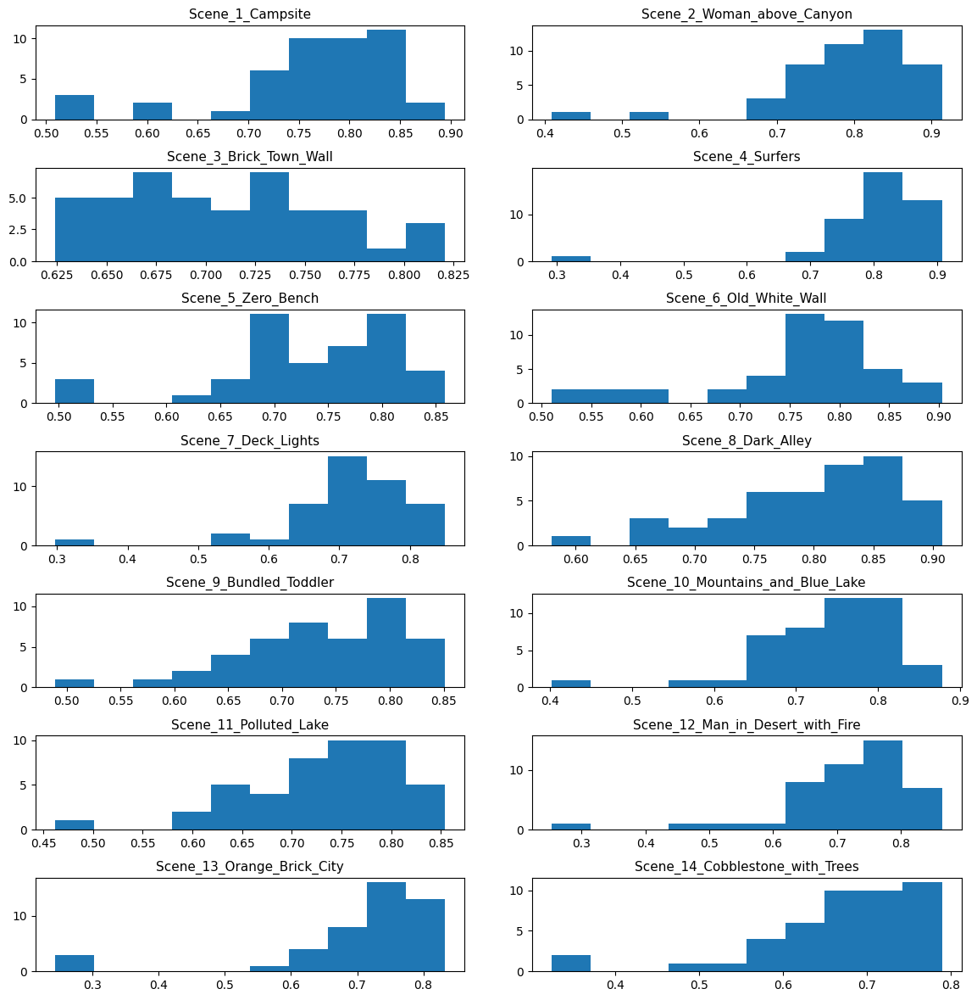

In [25]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(7, 2, figsize = (12, 12))
fig.tight_layout(pad=2)

for i, scene in enumerate(SCENE_LABELS):
    ax = axs[int(i/2), i%2]
    ax.hist(sg_csim_cembs[scene].values())
    ax.set_title(scene, size=11)

In [26]:
scene0 = SCENE_LABELS[0]

wresp_sg_csim_cembs = {}
for scene, csim_cembs in sg_csim_cembs.items():
    wresp = {pid: (csim, sg_responses[scene][pid]) for pid, csim in csim_cembs.items()}
    wresp_sg_csim_cembs[scene] = wresp
wresp_sg_csim_cembs

s0_wresp_csim_cembs = wresp_sg_csim_cembs[scene0]
wresp = s0_wresp_csim_cembs.values()
wresp_sorted = sorted(wresp, key=lambda x: x[0], reverse=True)

print("Sorted cosine similarity to mean point for '{}'".format(scene0))
for sim, resp in wresp_sorted:
    print("{}\t{}".format(sim, resp))

Sorted cosine similarity to mean point for 'Scene_1_Campsite'
0.894688623058322	a tent set up on a mountain during sunset. some camping gear laying around the scene. trees obfuscated the view of the valley.
0.8725716872311098	a tent overlooking a cliff at sunset. there was camping equipment in the foreground in front of the tent. the tent was under some trees.
0.842201239923798	a campsite at sunset with a tent
0.840683907208826	camp ground with a tent next to a tree. seems like it is sunrise because the sun is low in the sky and partially covered by the tree
0.8404955170239288	a sunset and a camping tent, underneath a tree. a lot of greenery. looks like they might be on top of a hill.
0.8390695298022742	a tent in the woods. the sun was setting and there were a few trees.
0.8367477828104022	sunset, a tent perched on the side of a mountain near a large tree, camping supplies and gear scattered around
0.8347711807318843	tent at sunrise on a mountain
0.83227303444607	tent under a tree look

In [27]:
scene1 = SCENE_LABELS[1]

wresp_sg_csim_cembs = {}
for scene, csim_cembs in sg_csim_cembs.items():
    wresp = {pid: (csim, sg_responses[scene][pid]) for pid, csim in csim_cembs.items()}
    wresp_sg_csim_cembs[scene] = wresp
wresp_sg_csim_cembs

s1_wresp_csim_cembs = wresp_sg_csim_cembs[scene1]
wresp = s1_wresp_csim_cembs.values()
wresp_sorted = sorted(wresp, key=lambda x: x[0], reverse=True)

print("Sorted cosine similarity to mean point for '{}'".format(scene1))
for sim, resp in wresp_sorted:
    print("{}\t{}".format(sim, resp))

Sorted cosine similarity to mean point for 'Scene_2_Woman_above_Canyon'
0.9135797395698492	girl in a white dress sitting on the edge of a cliff taking a picture of the scenery
0.8988504880324384	a women sitting on a cliff, she's wearing a white dress, she's taking a picture of the view. she is really close to the ledge of the cliff.
0.8968893561592163	a lady sitting in the edge of a mountain taking a picture of the view with a phone. the mountains are full of trees and the sky is blue. the lady was wearing a white dress and sandals.
0.8905301333608152	a girl in a white dress sitting on a mountain side taking a picture of the view
0.8892180677570126	a girl with long hair and white dress and sandals sitting on the ledge of a cliff taking a picture of the mountains
0.8761620749739414	a woman in a white dress taking a picture of a mountain scenery. lots of trees, clear skies, a gap between the mountain she is looking at and the one she is sitting on.
0.8718359322848473	a girl in a white dr

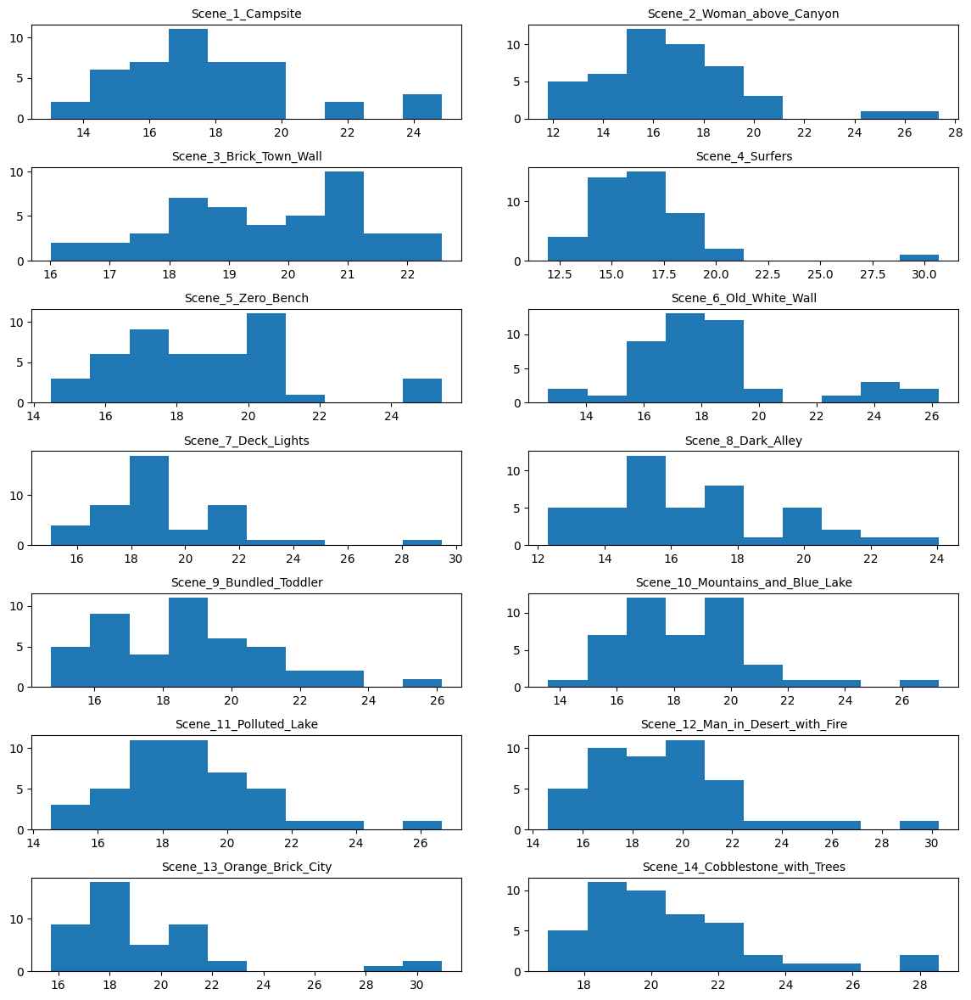

In [28]:
fig, axs = plt.subplots(7, 2, figsize = (12, 12))
fig.tight_layout(pad=2.0)

for i, scene in enumerate(SCENE_LABELS):
    ax = axs[int(i/2), i%2]
    ax.hist(sg_edist_cemb[scene].values())
    ax.set_title(scene, size=10)

### visualization

In [29]:
scene_embs = [(slabel, e) for slabel, scene in sg_cembs.items() for _, e in scene.items()]
all_embs = [e[1] for e in scene_embs]
all_ids = [id for _, scene in sg_cembs.items() for id, _ in scene.items()]

# First just PCA with 2 dimensions.
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(all_embs)
projected = pca.transform(all_embs)

pca.explained_variance_ratio_

array([0.07762301, 0.06882326])

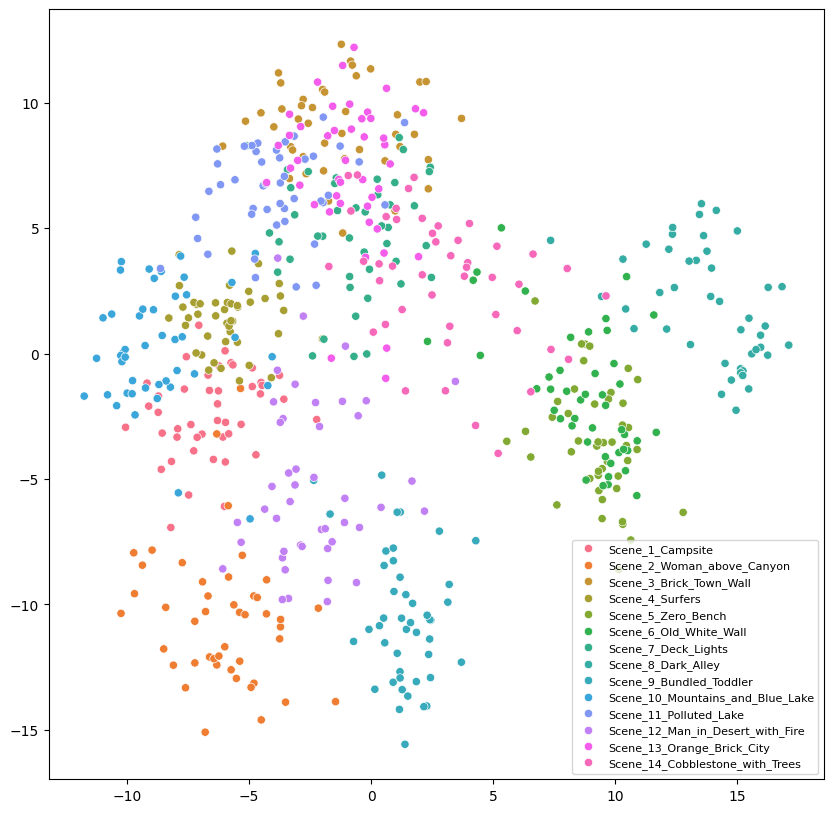

In [30]:
import seaborn as sns

scene_labels = [s for s, _ in scene_embs]
plt.figure(figsize=(10, 10))
gfg = sns.scatterplot(x=projected[:,0],
                        y=projected[:,1],
                        hue=scene_labels,
                        )
gfg.legend(fontsize=8)
plt.show()

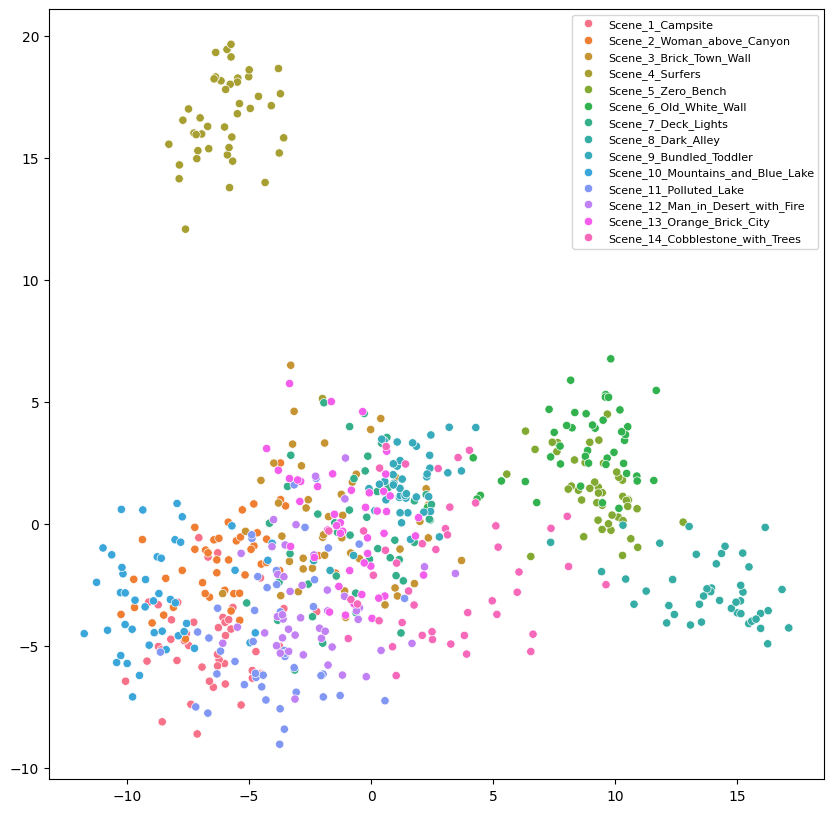

In [31]:
pca3d = PCA(n_components=3)
pca3d.fit(all_embs)
pca3d_projected = pca3d.transform(all_embs)

plt.figure(figsize=(10, 10))
gfg = sns.scatterplot(x=pca3d_projected[:,0], y=pca3d_projected[:,2], hue=scene_labels)
gfg.legend(fontsize=8)
plt.show()

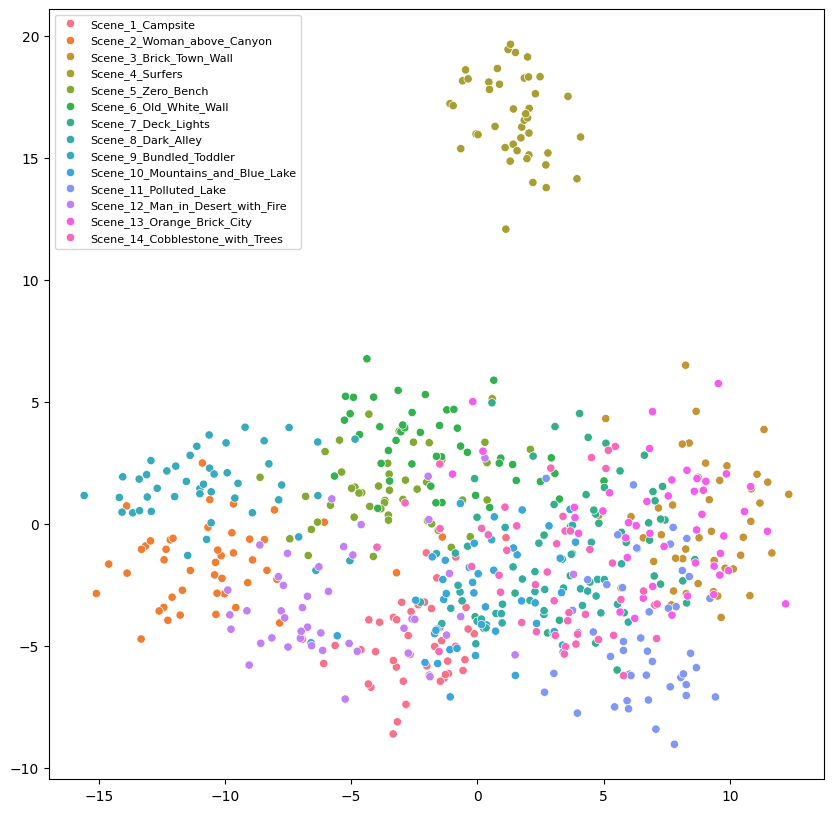

In [32]:
plt.figure(figsize=(10, 10))
gfg = sns.scatterplot(x=pca3d_projected[:,1], y=pca3d_projected[:,2], hue=scene_labels)
gfg.legend(fontsize=8)
plt.show()

In [33]:
# use pip install umap-learn in terminal.
import umap
reducer = umap.UMAP()

In [34]:
umap_projected = reducer.fit_transform(all_embs)

c:\Users\isaia\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


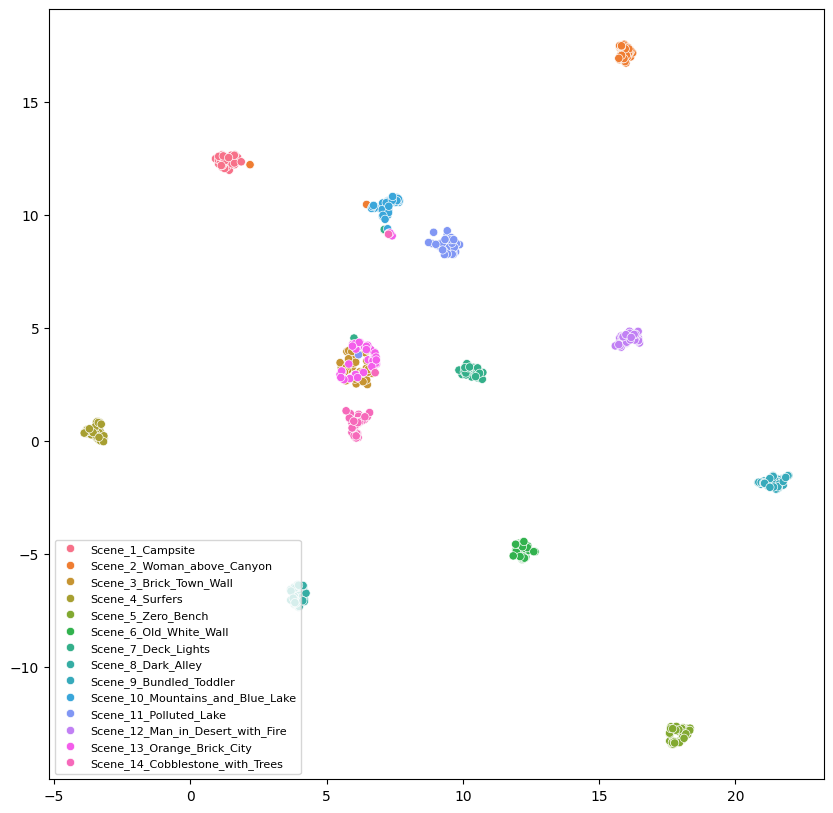

In [35]:
scene_labels = [s for s, _ in scene_embs]
plt.figure(figsize=(10, 10))
gfg = sns.scatterplot(x=umap_projected[:,0], y=umap_projected[:,1], hue=scene_labels)
gfg.legend(fontsize=8)
plt.show()

c:\Users\isaia\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


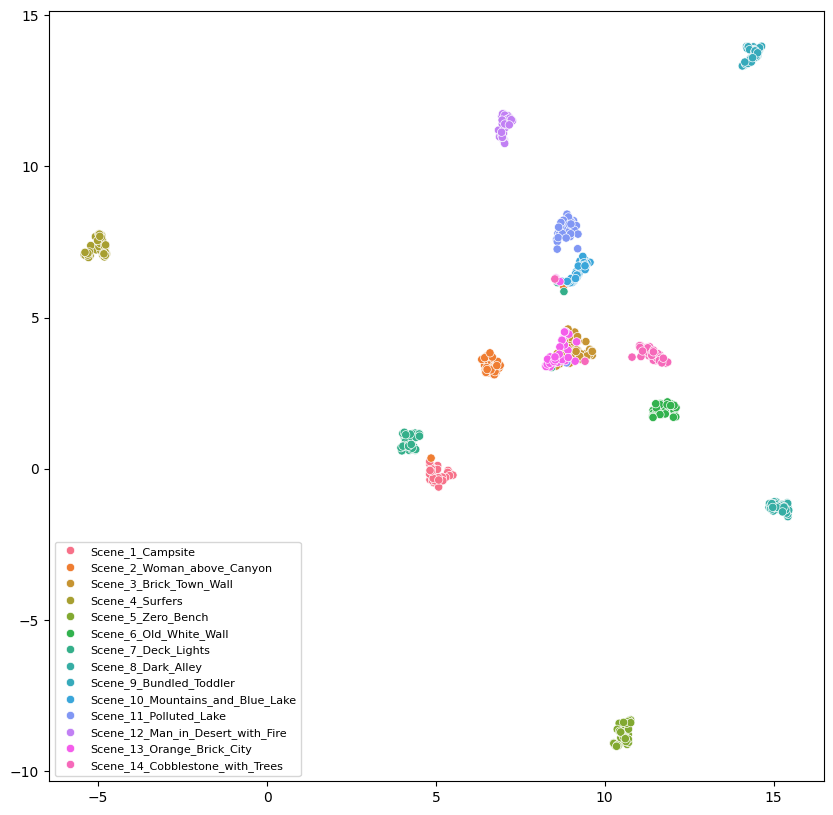

In [36]:
reducer3d = umap.UMAP(n_components=3)
umap_projected3d = reducer3d.fit_transform(all_embs)
scene_labels = [s for s, _ in scene_embs]
plt.figure(figsize=(10, 10))
gfg = sns.scatterplot(x=umap_projected3d[:,0], y=umap_projected3d[:,2], hue=scene_labels)
gfg.legend(fontsize=8)
plt.show()

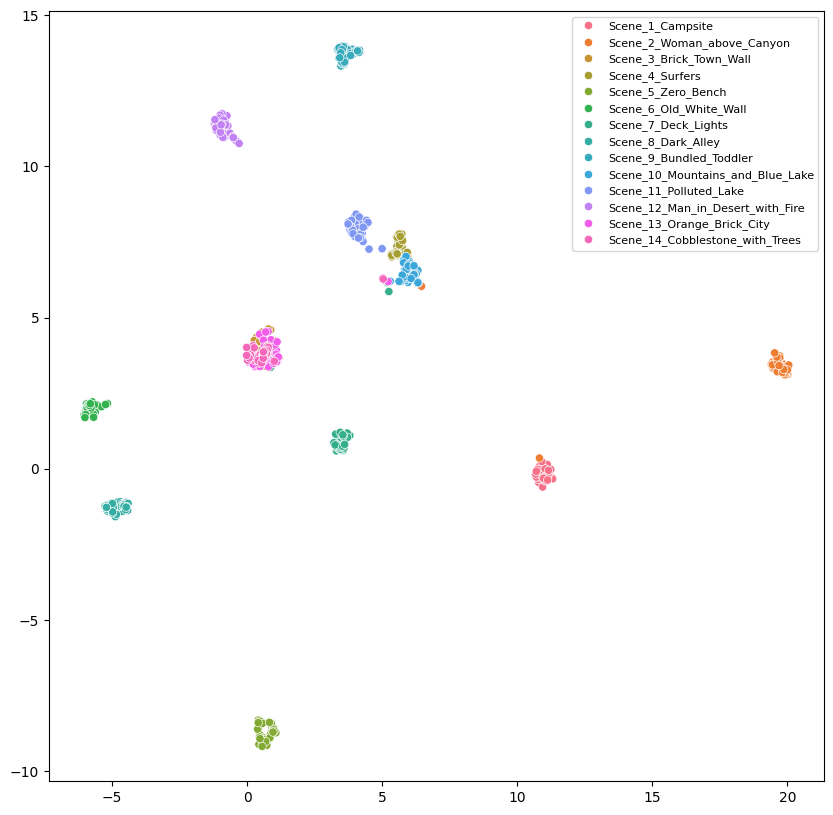

In [37]:
plt.figure(figsize=(10, 10))
gfg = sns.scatterplot(x=umap_projected3d[:,1], y=umap_projected3d[:,2], hue=scene_labels)
gfg.legend(fontsize=8)
plt.show()

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import umap
%matplotlib inline

def draw_umap(data, n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean', title='', labels=None):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(data);
    fig = plt.figure()
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], range(len(u)))
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1])
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2], s=100)
    if labels is not None:
        for i, label in enumerate(labels):
            ax.annotate(label, u[i])
    plt.title(title, fontsize=18)

c:\Users\isaia\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


<Figure size 1000x1000 with 0 Axes>

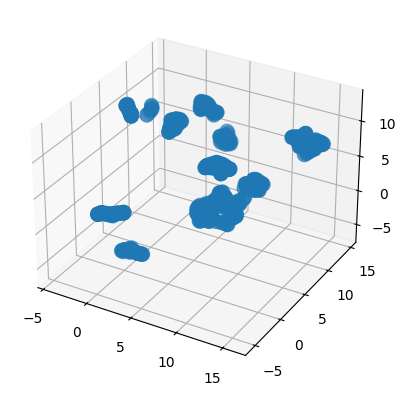

In [39]:
plt.figure(figsize=(10, 10))
scene_labels = [s for s, _ in scene_embs]
draw_umap(all_embs, n_components=3, n_neighbors=3, min_dist=0.2, metric="cosine")

In [40]:
def draw_scene_umap(data, n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean', title='', scene_labels=None):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(data)
    gfg = sns.scatterplot(x=u[:,0], y=u[:,1], hue=scene_labels)
    gfg.legend(fontsize=8)
    plt.show()

In [41]:
scene_labels = [s for s, _ in scene_embs]

c:\Users\isaia\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


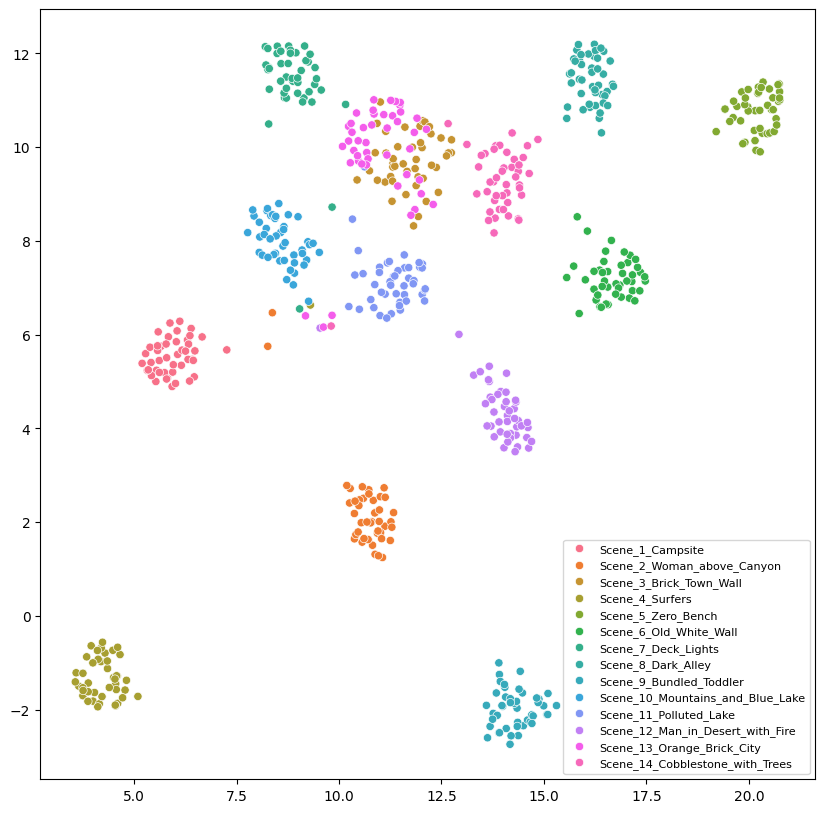

In [42]:
plt.figure(figsize=(10, 10))
draw_scene_umap(all_embs, n_neighbors=40, min_dist=0.5, scene_labels=scene_labels)

c:\Users\isaia\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


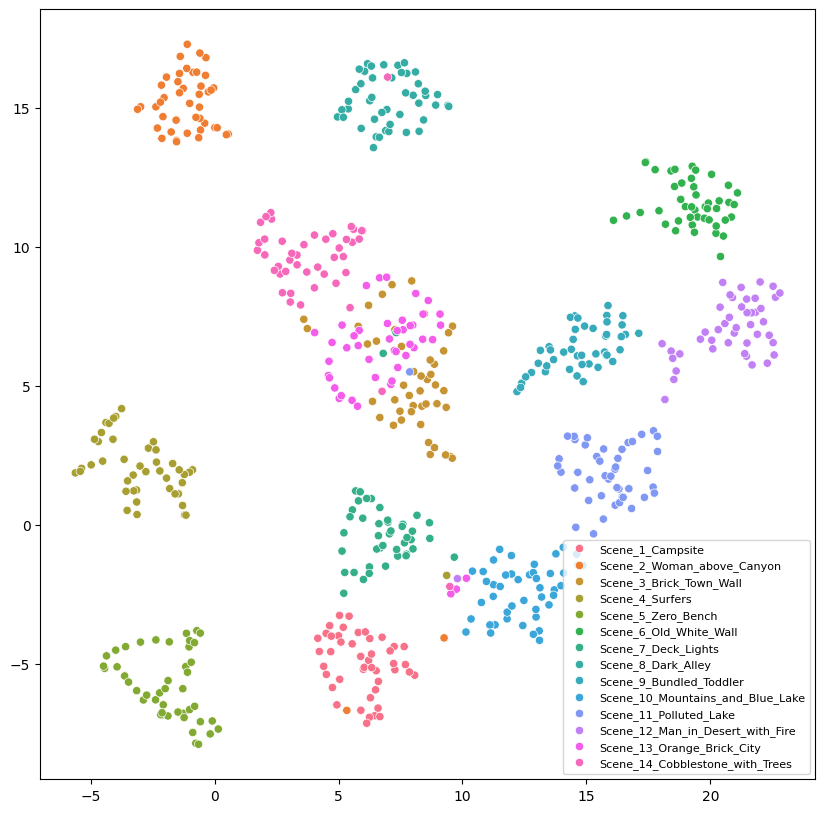

In [43]:
plt.figure(figsize=(10, 10))
draw_scene_umap(all_embs, n_neighbors=3, min_dist=0.7, scene_labels=scene_labels)

In [44]:
import numpy as np

def edist(p1, p2):
    return np.linalg.norm(p1 - p2)
    
def compute_std_outlier_indices(points, n_std=2):
    # 1. Take the mean of points
    # 2. Get edists
    # 3. Compute standard deviation of edists
    # 4. Print points that are > n stddev
    mean = np.mean(points)
    edists = [edist(p, mean) for p in points]
    edist_stdev = np.std(edists)
    edist_mean = np.mean(edists)
    # commented out IP # return [i for i, ed in enumerate(edists) if ed > (edist_mean + n_std*edist_stdev)]

#commented out IP # def label_point(x, y, val, ax):
    ax.text(x+.02, y, str(val))

def compute_cross_group_outlier_indices(grouped_points):
    """Computes indices of points that are closer to a different group.

    grouped_points: dict
        Group -> list of points

    Returns
        Group -> indices of points in group that are closer to another group mean
    """
    grouped_means = {
        group: np.mean(points, axis=0)
        for group, points
        in grouped_points.items()
    }
    result = {
        group: [
            i for i, p in enumerate(points)
            if any(
                edist(p, gm) < edist(p, grouped_means[group]) # distance to another group mean is closer than actual labeled group mean
                for mean_group_name, gm in grouped_means.items()
                if mean_group_name != group
            )
        ]
        for group, points
        in grouped_points.items()
    }
    result
    return result
    

def draw_scene_umap_w_outliers(data, 
                               n_neighbors=15, 
                               min_dist=0.1,
                               n_components=2,
                               metric='euclidean',
                               title='',
                               scene_labels=None,
                               figsize=(10,10),
                               outlier_labels=None, # Labels corresponding to data if found to be outlier
                               outlier_n_std=2 # NB: currenly unused
                              ):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(data)

    # Split data by scene labels.
    scene_points = { 
        scene: [p for p, sl in zip(u, scene_labels) if sl == scene] 
        for scene
        in scene_labels
    }
    scene_olabels = {
        scene: [ol for ol, sl in zip(outlier_labels, scene_labels) if sl == scene] 
        for scene
        in scene_labels
    }
    
    # Collect plotting data: points, scene labels
    plot_points = []
    plot_labels = []
    for scene in scene_points.keys():
        points = scene_points[scene]
        plot_points.extend(points)
        plot_labels.extend([scene]*len(points))

    plot_points = np.array(plot_points)

    plt.figure(figsize=figsize)
    gfg = sns.scatterplot(x=plot_points[:,0], y=plot_points[:,1], hue=plot_labels)

    cross_group_outlier_indices = compute_cross_group_outlier_indices(scene_points)
    for scene, outlier_indices in cross_group_outlier_indices.items():
        points = scene_points[scene]
        outlier_labels = scene_olabels[scene]
        for outlier_idx in outlier_indices:
            outlier_point = points[outlier_idx]
            outlier_label = outlier_labels[outlier_idx]
            # Commented out IP # label_point(outlier_point[0], outlier_point[1], outlier_label, plt.gca())

    ##
    ## Std dev.- based outliers
    ##
    # Compute outlier indices of each split, then concatenate.
    #scene_outlier_indices = {
    #    scene: compute_outlier_indices(points, outlier_n_std)
    #    for scene, points
    #    in scene_points.items()
    #}
    
    # Label outliers
    #for scene in scene_points.keys():
    #    points = scene_points[scene]
    #    outlier_indices = scene_outlier_indices[scene]
    #    # Label outliers.
    #    for outlier_idx in outlier_indices:
    #        outlier_point = points[outlier_idx]
    #        print("scene: {}".format(scene))
    #        label_point(outlier_point[0], outlier_point[1], "outlier", plt.gca())
    
    gfg.legend(fontsize=8)
    plt.show()

c:\Users\isaia\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


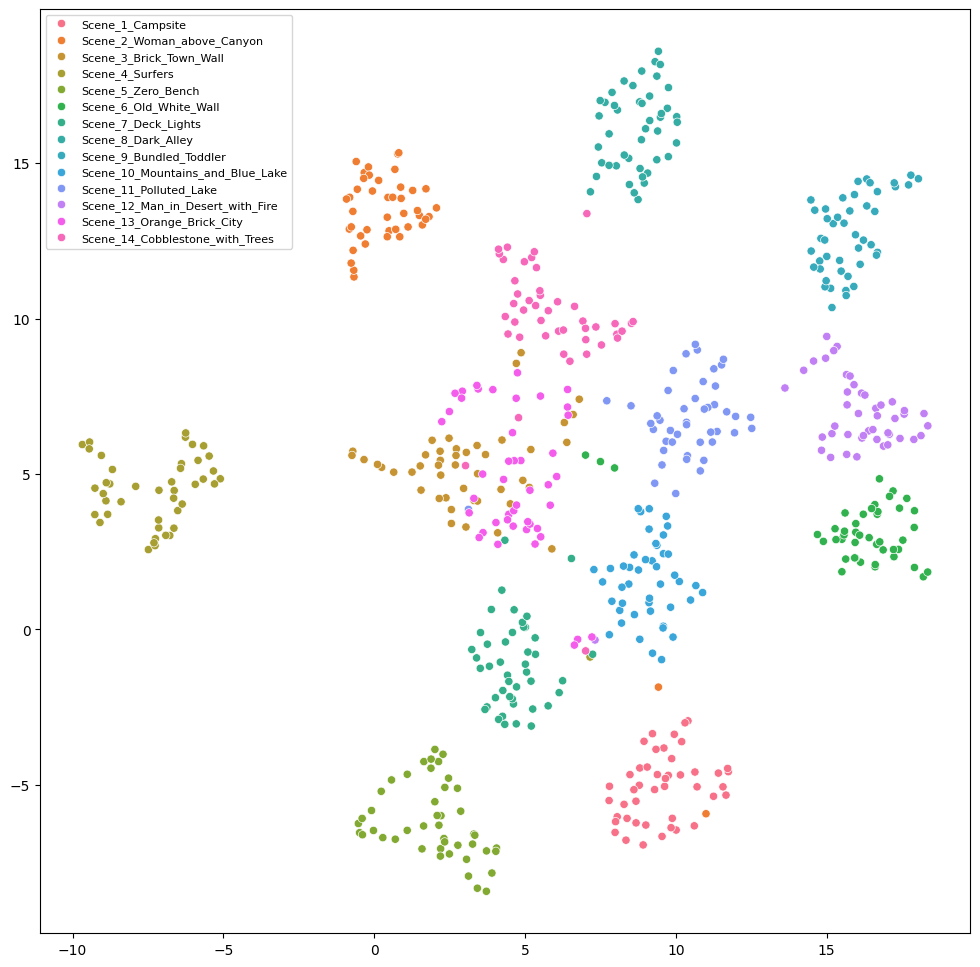

In [45]:
draw_scene_umap_w_outliers(all_embs, n_neighbors=3, min_dist=0.7, scene_labels=scene_labels, figsize=(12,12), outlier_labels=all_ids) # Remove hashtags in chunk above to run with labels

In [46]:
# Scene 4 points that are in the scene 1 cluster
print(sg_responses['Scene_2_Woman_above_Canyon']['9'])
print(sg_responses['Scene_2_Woman_above_Canyon']['42'])

i saw a lot of trees. i also saw a crevasse running down the mountain. on top of the mountain was a woman in a white dress posing for a selfie with her phone.
hiking trip, with risky girl


In [47]:
# Scene 4 responses away from cluster
#print(sg_responses['Scene 4: Surfers']['l2'])
print(sg_responses['Scene_4_Surfers']['42'])

moana movie


In [48]:
# Scene 8 response that is in the middle of the scene 6 cluster
sg_responses['Scene_6_Old_White_Wall']['14']

'another old looking building or house. the door looks broken and there is paint chipping on the building as well, it is white.'

c:\Users\isaia\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


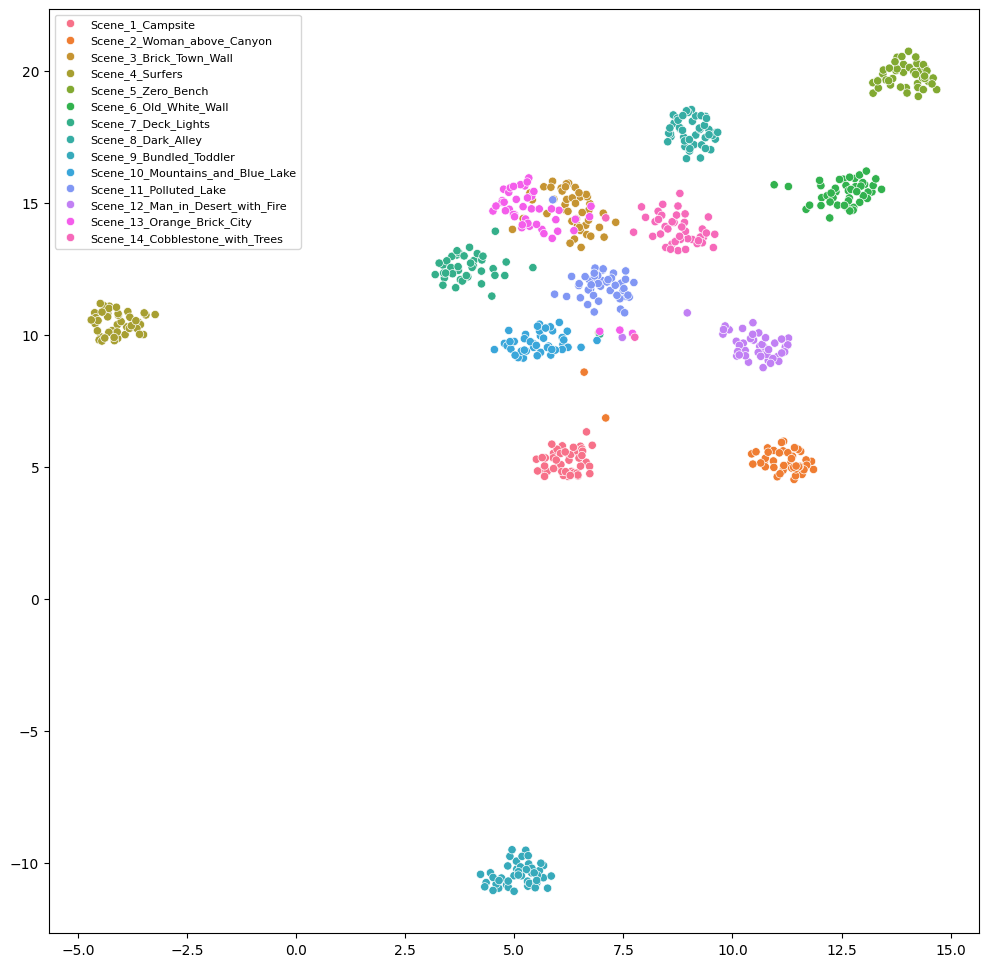

In [49]:
draw_scene_umap_w_outliers(all_embs, n_neighbors=40, min_dist=0.5, scene_labels=scene_labels, figsize=(12,12), outlier_labels=all_ids) # Remove hashtags in chunk above to run with labels

In [50]:
# Scene 7 at the edges, closter to other clusters
print(sg_responses['Scene_7_Deck_Lights']['7'])
print(sg_responses['Scene_7_Deck_Lights']['4'])
#print(sg_responses['Scene 7: Deck Lights']['l2'])

mountains in the background with blue water surrounding a walk way that had lights that lead out to a sheltered area, the roof was some kind of straw like material, with people sitting under it. at a little after sunset
a bridge with a porch-like structure above water.


c:\Users\isaia\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


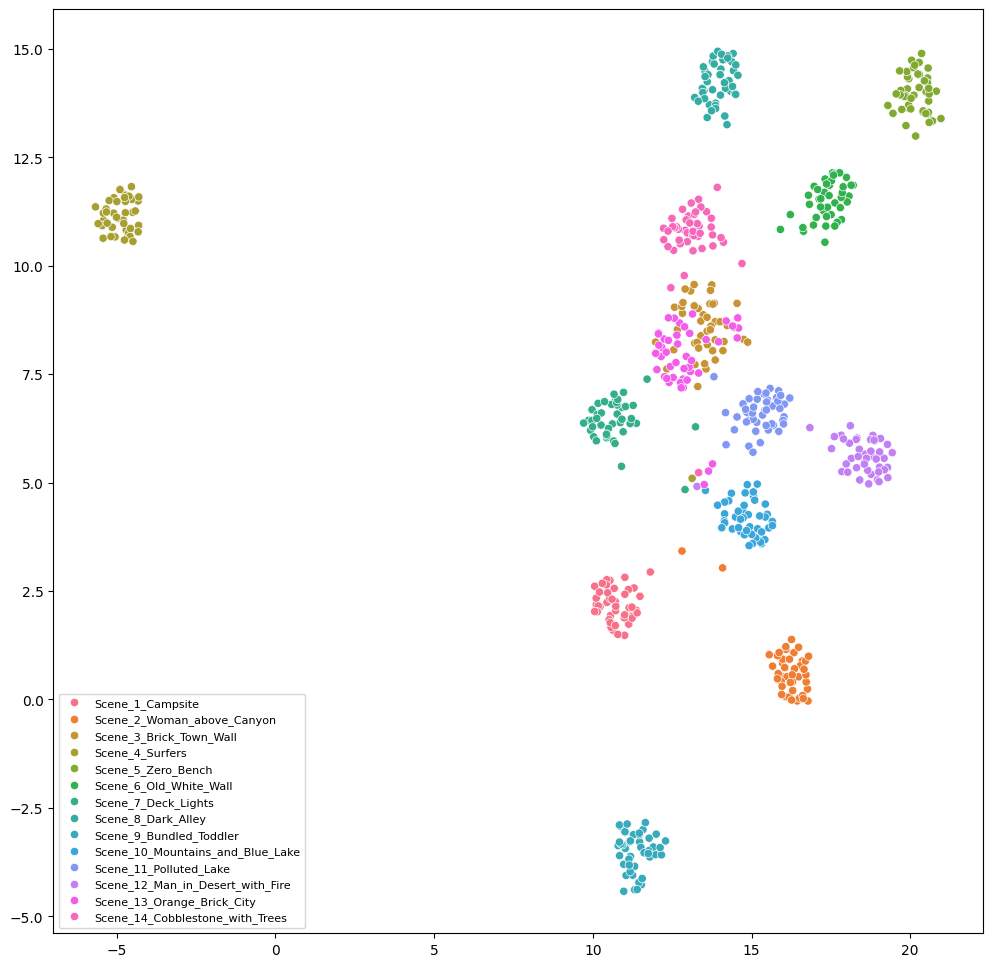

In [51]:
draw_scene_umap_w_outliers(all_embs, n_neighbors=40, min_dist=0.5, scene_labels=scene_labels, figsize=(12,12), outlier_labels=all_ids)